In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
%matplotlib inline

np.random.seed(2)

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import itertools

from keras.utils.np_utils import to_categorical # convert to one-hot-encoding
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from keras.optimizers import RMSprop
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau


sns.set(style='white', context='notebook', palette='deep')

Using TensorFlow backend.


In [5]:
from PIL import Image
import os
from pylab import *
import re

In [6]:
def get_imlist(path):
    return [os.path.join(path,f) for f in os.listdir(path) if f.endswith('.png')]

In [31]:
real_imfile_list = []
fake_imfile_list = []
for im_filename in sorted(get_imlist('datasets/')):
    if re.search(r'copy', im_filename) == None:
        real_imfile_list.append(Image.open(im_filename).convert('RGB'))
    else:
        fake_imfile_list.append(Image.open(im_filename).convert('RGB'))

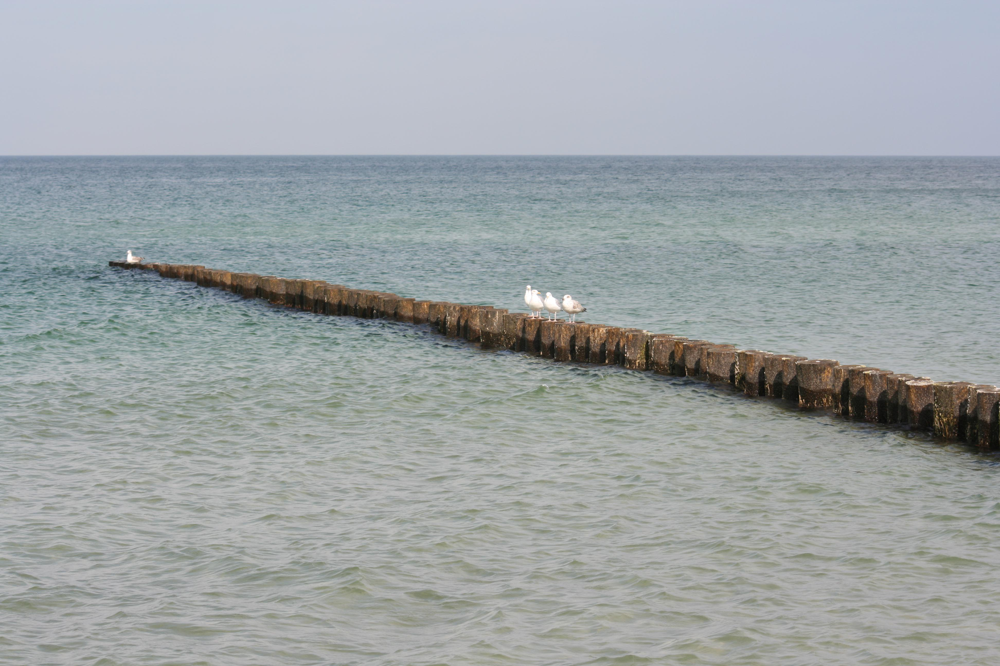

In [23]:
real_imfile_list[0]

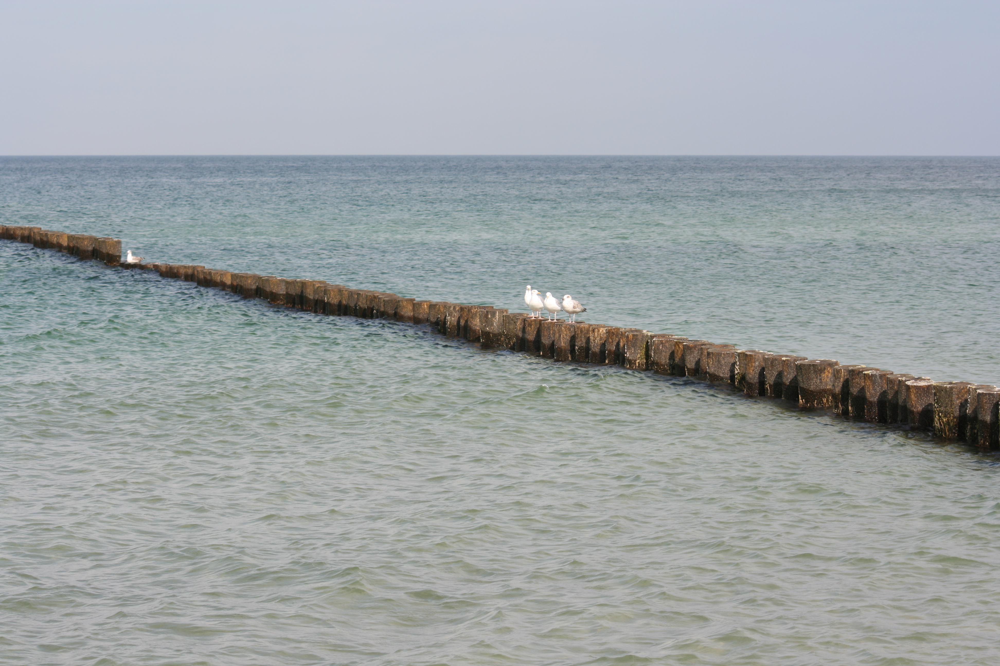

In [24]:
fake_imfile_list[0]

In [64]:
import subprocess

result = subprocess.run(['exiftool', '/home/agus/Project/FakeImageDetector/datasets/barrier_copy.png'], stdout=subprocess.PIPE)

normal_string = result.stdout.decode('utf-8')
print(normal_string)

ExifTool Version Number         : 10.80
File Name                       : barrier_copy.png
Directory                       : /home/agus/Project/FakeImageDetector/datasets
File Size                       : 8.8 MB
File Modification Date/Time     : 2011:04:26 14:02:06+07:00
File Access Date/Time           : 2018:08:31 21:56:37+07:00
File Inode Change Date/Time     : 2018:08:31 21:51:23+07:00
File Permissions                : rw-r--r--
File Type                       : PNG
File Type Extension             : png
MIME Type                       : image/png
Image Width                     : 3888
Image Height                    : 2592
Bit Depth                       : 8
Color Type                      : RGB
Compression                     : Deflate/Inflate
Filter                          : Adaptive
Interlace                       : Noninterlaced
Pixels Per Unit X               : 2835
Pixels Per Unit Y               : 2835
Pixel Units                     : meters
Profile Name                    

In [67]:
import requests

filePath = '/home/agus/Project/FakeImageDetector/datasets/barrier_copy.png'
searchUrl = 'http://www.google.com/searchbyimage/upload'
multipart = {'encoded_image': (filePath, open(filePath, 'rb')), 'image_content': ''}
response = requests.post(searchUrl, files=multipart, allow_redirects=False)
fetchUrl = response.headers['Location']

True

In [68]:
print(fetchUrl)

http://www.google.com/search?tbs=sbi:AMhZZisg4L30J63PQH7ewSnEouFLmTmteQPUKABT-Ag4fDK5XlqUhS7q1ZUZ9P5NZ1Oq_1DJmYdK9Hg986E67xtOCTAfzSVZzVJn8_1N6KRgpe1YklMRiks189R5mNggtW8oNQ0W9Bc7WotZHk6kGicwLhNbT9qa1upQvQbH_1VWAogk5rtCypdShc2UGIjTxqBngZLYQZjd_1aJpRJPmntSEQpEp9GZGAcEIhO2ODkeKWiRQeLUv35T4NyVMS7N30hqjqhcF1ybELymGYTR6Nvn_1oNrL1Ffqw7gsZizU1OmraDgRTkau4e-p4P4lB9y_1QHkKp_1CADu1CUxoxZBCHFrrDz2QJBsGkmgysN57UyMiNDYWGcrtwLolfNw
